In [1]:
import pandas as pd
import numpy as np
from functools import reduce
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import pandas_profiling
import matplotlib.dates as mdates

## The datasets
>The data comes from [ClimateBC](http://climatebc.ca/) and [ClimateNA](http://climatena.ca/), two websites provided by Dr. Wang, a Professor in the Forestry Department at UBC in Vancouver. The websites provides tools to downscale meorological data from the PRISM climate group to observe long term and short term trends in the climate. With this, it is possible to choose any location in North America and receive highly detailed climate data for that location dating back to 1901.
The data is very extensive, so the difficulty lays in choosing which variables to observe and compare over time. For my project - determining the signs of climate change in ski resorts, it fits perfectly. By obtaining climate data for the location of several ski resorts in coastal and continental regions, I will be able to follow climatic trends that those regions are experiencing. Specifically the measurements {PAS - precipitation as snow} will prove useful in showing important developments for the ski resorts. Additionally, it is certainly helpful to compare the average temperature and the degree-days below 0°C {DD<0} to detect any major trends in the data. The degree-days below °C note how many days multiplied by how many degrees below freezing have occured in the measured timeline.
I expect to see an observable decline in precipitation as snow on the coastal ski resorts since those have been particularly affected by climate change.The changes in average temperature will also indicate if major changes have occured in the investigated locations. However, I also don't expect to see too many changes, potentially not even clearly destinguishable trends in the continental ski resorts. Some of the continental resorts might even show an improvement in ski conditions because climate change induced changes can even increase snowfall for continental locations for now.

## This dataset

>The dataset analyzed in this notebook covers data from Whistler Blackcomb, the enormous resort in British Columbia just north of Vancouver. The climate at Whistler is highly dominated by the Pacific Ocean, hence we can classify Whistler as a *coastal* resort.
The code used to clean, slice, visualize and compare the data will work for data of all other ski resorts that are to be analyzed in the future as well. Hopefully, I will get to add many more in the course of this project.

In [56]:
# exploring dataframe for a specific location
# key to important variables is in (..\data\raw\README.md)
df = pd.read_csv(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502\data\raw\Whistler.csv')
df

,Year,lat,long,elev,MAT,MWMT,MCMT,TD,MAP,MSP,...,RH(03),RH(04),RH(05),RH(06),RH(07),RH(08),RH(09),RH(10),RH(11),RH(12)
0,1901,50.1038,-122.9136,1480,2.6,12.4,-5.9,18.3,1513,334,...,68,68,64,63,65,61,67,69,73,73
1,1902,50.1038,-122.9136,1480,1.9,10.8,-5.6,16.4,1602,319,...,70,66,66,58,64,61,63,67,71,73
2,1903,50.1038,-122.9136,1480,1.8,10.6,-6.9,17.5,1525,583,...,59,67,63,60,68,70,75,67,68,70
3,1904,50.1038,-122.9136,1480,2.5,11.2,-7.5,18.8,1409,258,...,68,63,62,58,59,57,62,71,67,75
4,1905,50.1038,-122.9136,1480,2.4,12.1,-5.8,17.8,1237,473,...,69,59,59,59,60,65,73,67,64,74
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,2015,50.1038,-122.9136,1480,4.5,12.4,-3.2,15.6,1274,326,...,78,74,63,60,71,72,79,78,76,81
115,2016,50.1038,-122.9136,1480,3.8,12.2,-6.3,18.6,1543,312,...,78,71,67,69,76,72,77,85,85,85
116,2017,50.1038,-122.9136,1480,3.2,13.5,-4.6,18.1,1365,164,...,84,79,67,66,68,70,75,78,83,83
117,2018,50.1038,-122.9136,1480,3.5,12.8,-4.4,17.2,1442,337,...,77,75,65,72,68,74,81,73,80,86


In [57]:
df.head()
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,119.0,1960.000000,3.449638e+01,1901.0000,1930.5000,1960.0000,1989.5000,2019.0000
lat,119.0,50.103800,7.135472e-14,50.1038,50.1038,50.1038,50.1038,50.1038
long,119.0,-122.913600,1.141675e-13,-122.9136,-122.9136,-122.9136,-122.9136,-122.9136
elev,119.0,1480.000000,0.000000e+00,1480.0000,1480.0000,1480.0000,1480.0000,1480.0000
MAT,119.0,2.360504,7.874243e-01,0.0000,1.8000,2.4000,2.8500,4.5000
...,...,...,...,...,...,...,...,...
RH(08),119.0,69.436975,4.406541e+00,57.0000,66.0000,70.0000,73.0000,81.0000
RH(09),119.0,72.109244,4.653757e+00,58.0000,69.0000,72.0000,75.0000,83.0000
RH(10),119.0,74.369748,4.301883e+00,63.0000,72.0000,75.0000,77.0000,85.0000
RH(11),119.0,73.394958,4.464964e+00,64.0000,70.0000,73.0000,76.0000,85.0000


In [58]:
# exploring the dataframe
df
df.iloc[:,20:50]
df.iloc[:,50:80]
df.iloc[:,80:110]
df.iloc[:,110:140]
df.iloc[:,140:170]
df.iloc[:,170:200]
df.iloc[:,200:230]

,NFFD(10),NFFD(11),NFFD(12),PAS(01),PAS(02),PAS(03),PAS(04),PAS(05),PAS(06),PAS(07),...,Eref(06),Eref(07),Eref(08),Eref(09),Eref(10),Eref(11),Eref(12),CMD(01),CMD(02),CMD(03)
0,15,7,3,157,137,78,90,17,16,2,...,83,92,92,48,28,12,0,0,0,0
1,10,2,1,95,162,201,62,39,5,3,...,93,90,85,51,27,0,0,0,0,0
2,10,3,4,108,33,128,49,34,2,3,...,101,85,73,40,27,0,0,0,0,0
3,13,7,3,120,206,225,46,22,4,1,...,95,104,92,56,26,14,0,0,0,0
4,4,3,2,76,60,67,44,30,2,1,...,97,107,79,44,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,21,4,4,37,49,40,27,1,0,0,...,107,92,73,39,24,0,0,0,0,0
115,16,11,2,90,70,113,2,8,4,2,...,83,77,75,41,17,9,0,0,0,0
116,15,6,5,53,167,178,97,16,2,0,...,88,96,83,46,22,0,0,0,0,0
117,13,9,4,92,97,82,48,2,5,0,...,76,97,72,37,24,10,0,0,0,0


> There are 4 descriptive, categorical varialbes (columns), 23 annual variables, 14 seasonal variables for each of the 4 season (total 56 columns) and 14 monthly variables for each of the 12 months (total 168 columns) for a total of 251 columns over 119 years (observations from 1901 to 2019). This describes all the historical datasets in the correct order that will be investigated

> It seems like there is something wrong with the Radiation data (negative radiation).
The data assumes the Value **-9999.0** instead of **NaN** as null value. 
The majority of values is invalid, hence I will probably drop the column.

In [59]:
# let's take a closer look some annual variables:
# Selecting specific columns since the dataset would be too big to run otherwise.
# Warning: loading this might take quite a bit of processing time.

df_annual = df.iloc[:,[4,5,6,12,13,16,20,26]]
df_annual_c = df_annual.copy()
df_annual_c.profile_report()

In [60]:
df_winter = df.iloc[:,[27,31,35,39,43,47,51,55,59,63,67,71,75,79]]
df_winter_c = df_winter.copy()
df_winter_c.profile_report()

In [61]:
# investigating the rejected DD>18
df_winter.iloc[:,8].describe()

count    119.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: DD>18_wt , dtype: float64

> The variable Degree-days above 18°C was rejected by the analysis since there is not a single occurance of Temperature above 18°C in the seasonal record.

In [62]:
# investigating radiation values
df_winter.iloc[:,4].describe()

count     119.000000
mean    -4702.770588
std      5014.446869
min     -9999.000000
25%     -9999.000000
50%         1.000000
75%         5.450000
max        11.600000
Name: Rad_wt , dtype: float64

> At least 25% of the radiation values are invalid

In [66]:
df_winter.iloc[:,12].describe()

count    119.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: CMD_wt , dtype: float64

> No values other than 0 in the seasonal winter data. This is probably due to the snowcover and freezing temperatures preventing any heavesgrass activeness. This variable isn't of particular interest to my study.

## First observations:
- The dataframe is pretty big, it will require some cleaning and wrangling to draw conclusions.
- Apart from the radiation and climatic moisture deficit values, the dataset seems solid without missing or invalid data 
- Obvious negative linear relationship between mean annual temperature (MAT) and degree-days below freezing (DD<0°C) -> makes sense as well
- There might to be some form of (indirect) correlation between relative humidity (RH) and the number of frost-free days (NFFD). The answer to that could be that both variables are related to the temperature.
- The relationship between snowfall and temperature is certainly not linear. Snowfall depends on a number of other factors as well, even though the correct temperature range is certainly a prerequisite
- Annual data is limited to draw conclusions from, since data from the summer months obstructs the view onto the (in my case) more interesting winter data.

# Data Wrangling

### Relative import

In [2]:
import sys, os
sys.path.insert(0, os.path.abspath('..'))
from project_function import project_function as pj
pj.load_and_process(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502\data\raw\Whistler.csv')

> By plugging in different datasets for different locations into the function, 
it is now possible to create single datasets for annual, seasonal and monthly variables for each location.
The datasets will be saved in the \data\processed directory:

In [65]:
# saving output data into files

pj.monthly_data.to_csv(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502\data\processed\Whistler_months.csv', index=False)
pj.seasonal_data.to_csv(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502\data\processed\Whistler_seasons.csv', index=False)
pj.annual_data.to_csv(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502\data\processed\Whistler_years.csv', index=False)

# Research questions

- Is climate change affecting ski resorts in North America? 
- How does it show?

### Subquestions
- Are there any variables in the data which show distinctive trends over the investigated time?
- Are those variables generally associated with climate change?
- How do coastal ski resorts compare to continental ski resorts?

# Analysis and visualizations of the cleaned data

> The investigation of the dataset at the beginning of this analysis showed, that annual data is very superficial.
There are many trends and many causes in annual data that can skew the data and make it improbable to find important signs of climate change in my area of interest.
Hence I will mainly look at seasonal (winter) and at monthly data to determine how climate change might be influencing the investigated ski resorts.
The variables which are particularly interesting for the research questions are *Degree-days < 0, Temperature(min, ave, max)* and *Snowfall*. 
Because the main research looks at changes in temperature and snowfall over time, the visuals used are mainly line plots.

### Seasonal winter data

In [89]:
# exploring seasonal data 
pj.seasonal_data.shape
pj.seasonal_data.head(10)
pj.seasonal_data.columns
pj.seasonal_data.describe().apply(lambda s: s.apply(lambda x: format (x, 'f')))

,Year,Max Temp,Min Temp,Ave Temp,Precipitation,DDays < 0°C,DDays > 5°C,DDays < 18°C,DDays > 18°C,Frost Free Days,Snowfall,Evaporation,Moisture Deficit,Relative Humidity
count,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000
mean,1960.000000,-1.589076,-7.640336,-4.610924,572.554622,493.319328,0.470588,2029.344538,0.000000,7.310924,389.840336,0.252101,0.000000,74.554622
std,34.496377,1.605277,2.129626,1.819936,155.254777,138.505702,1.358111,163.881077,0.000000,4.075033,133.297996,1.637580,0.000000,4.391242
min,1901.000000,-6.700000,-13.400000,-10.100000,198.000000,240.000000,0.000000,1684.000000,0.000000,1.000000,152.000000,0.000000,0.000000,65.000000
25%,1930.500000,-2.250000,-8.800000,-5.500000,456.500000,391.500000,0.000000,1911.500000,0.000000,4.000000,285.500000,0.000000,0.000000,72.000000
50%,1960.000000,-1.400000,-7.600000,-4.500000,573.000000,477.000000,0.000000,2019.000000,0.000000,6.000000,382.000000,0.000000,0.000000,74.000000
75%,1989.500000,-0.650000,-6.050000,-3.250000,676.000000,556.500000,0.000000,2108.000000,0.000000,10.000000,478.500000,0.000000,0.000000,77.000000
max,2019.000000,1.700000,-3.200000,-0.700000,986.000000,958.000000,7.000000,2532.000000,0.000000,22.000000,685.000000,14.000000,0.000000,85.000000


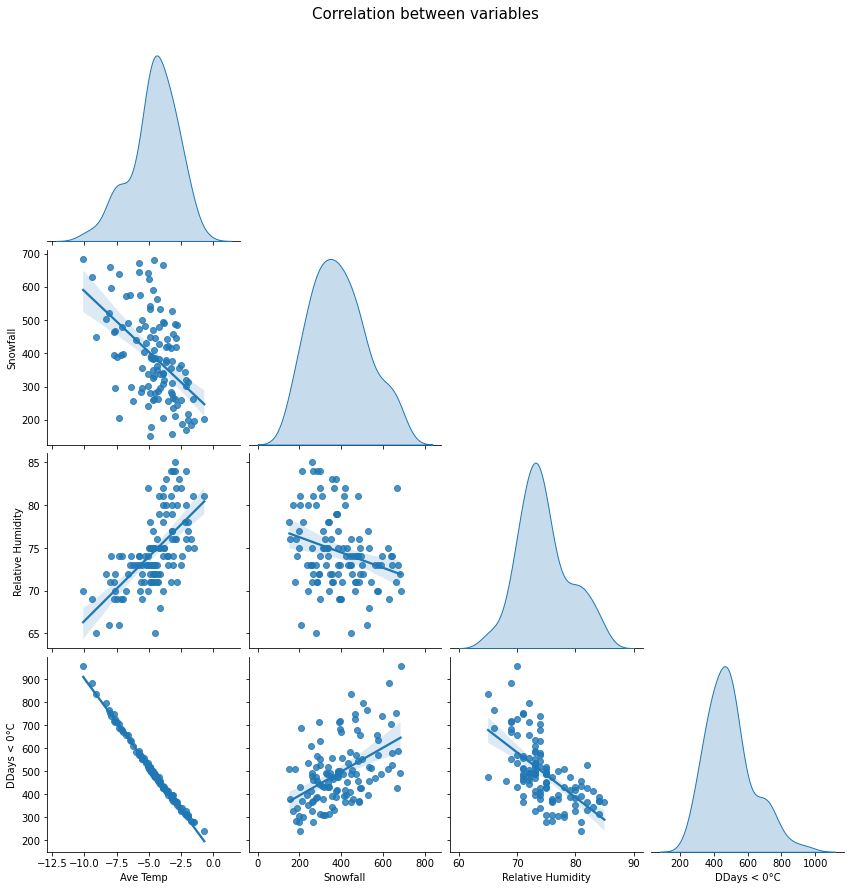

In [52]:
# Trying to observe potential correlations between different variables at seasonal observations

selected_df_winter = pj.seasonal_data.loc[:,['Ave Temp', 'Snowfall', 'Relative Humidity', 'DDays < 0°C']]
sns.pairplot(selected_df_winter, 
             kind = 'reg', 
             diag_kind='kde', 
             height=3,
             corner=True
            )
plt.suptitle('Correlation between variables', y=1.03, fontsize=15)

plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_cor_Y')

> Just by looking at the graphs, it appears that there is a linear relationship between Average Temperature and Degree-days below freezing and a decent linear fit for the trendline between between Temperature and Relative Humidity. 
Both correlations seem reasonable: Lower temperature implies more degree-days below freezing and cold air can only hold less humidity than warm air. 
Other correlations between the variables are tougher to see at a first glance and might be less strong or simply not existant.

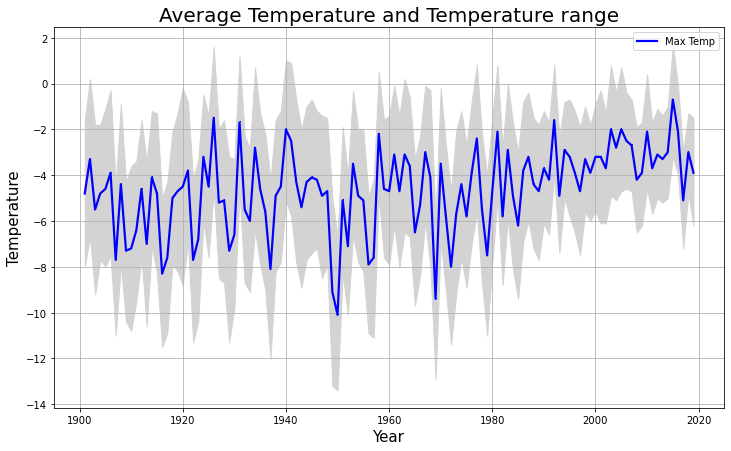

In [54]:
# Let's investigate how some variables change over time.

X  = np.linspace(0,3,200)
# Visualizing average, max, min winter termperatures over time
plt.figure(figsize = (12,7))
plt.plot('Year', 'Ave Temp', data=pj.seasonal_data, linestyle='solid', marker=',', color='blue', lw=2.2)

# no need to plot max and min when shading the area in between lines
# plt.plot('Year', 'Max Temp', data=seasonal_data, linestyle='solid', marker=',', color='salmon')
# plt.plot('Year', 'Min Temp', data=seasonal_data, linestyle='solid', marker=',', color='salmon')

# Creating labels, legend and the grid
plt.xlabel('Year', fontsize = 15)
plt.ylabel('Temperature', fontsize = 15)
plt.legend(['Max Temp', 'Ave Temp', 'Min Temp'])
plt.title('Average Temperature and Temperature range', fontsize = 20)
plt.grid(True)

# filling the area between maximum and minimum temperature
plt.fill_between(pj.seasonal_data['Year'],pj.seasonal_data['Max Temp'],pj.seasonal_data['Min Temp'], color='lightgrey')

plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_temp_range_Y')

> Over the years, minimum and maximum temperatures edge closer together. 
This phenomenon is a sign of changing climatic conditions. (I will elaborate in my literature review).
The data also shows a slight but steady warming trend since around 1970. It seems that since then temperatures haven risen by about 2°C which is a massive rise for mean temperature.

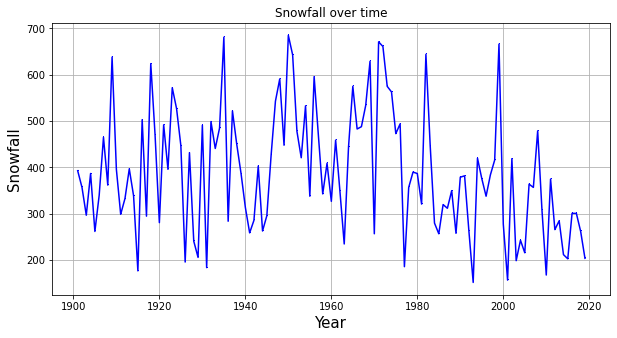

In [67]:
# Let's invetigate snowfall over time 

plt.figure(figsize = (10,5))
plt.plot(pj.seasonal_data['Year'], 
         pj.seasonal_data['Snowfall'], 
         linestyle='solid', 
         marker=',', color='blue')
plt.xlabel('Year', fontsize = 15)
plt.ylabel('Snowfall', fontsize = 15)
plt.title('Snowfall over time')
plt.grid(True)


> There is quite a bit of *background noise* in the data, obstructing any clear major trends. It would be better to investigate with a fitting trendline perhaps

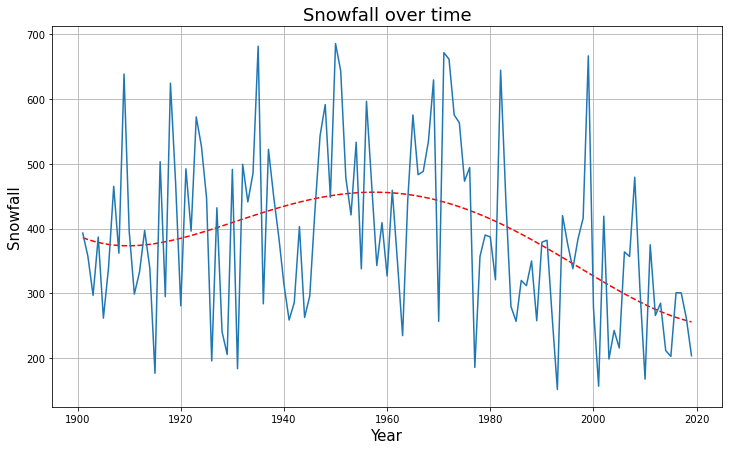

In [68]:
# Same graph with added trendline

# Setting up the plot and parameters for the trendline
X = np.array(pj.seasonal_data['Year'])
Y = np.array(pj.seasonal_data['Snowfall'])
fig, ax = plt.subplots(figsize = (12,7))
np.shape(X)
np.shape(Y)

# Fitting in a trendline of 4th degree
Z = np.polyfit(X, Y, 4)
ZZ = np.poly1d(Z)
ax.plot(X, ZZ(X),'r--')
ax.plot(X, Y)

# adding labels, title and grid
plt.xlabel('Year', fontsize = 15)
plt.ylabel('Snowfall', fontsize = 15)
plt.title('Snowfall over time', fontsize = 18)
plt.grid(True)

plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_snow_Y')

> The graph shows an increase in snowfall in the earlier records and a steep decline in the snowfall level since about 1970. However, it would be good to have a few more data points to be more certain of said developments.

### Monthly data

> Sicne there is monthly data for the entire record available, I will analyze important variables with that data as well. The results should be more exact and better to draw conclusions from. With the amount of data however, plots easily become chaotic.

In [90]:
# Specifying the months of interest. The different lists of months serves to investigate the data from different perspectives.
winter_months_2 = ['Jan', 'Feb']
winter_months_3 = ['Dec', 'Jan', 'Feb']
winter_months_5 = ['Nov', 'Dec', 'Jan', 'Feb', 'Mar']
winter_months_7 = ['Oct','Nov', 'Dec', 'Jan', 'Feb', 'Mar', 'Apr']

# Some of the following graphs turn messy or simply don't work when dealing with too many months, hence the ability to specify
# which months to use for the visualisations here.


# Merging the Month and the Year into one column
# In order to use different months in the following graphs it simply needs a tiny adjustment in the following line of code! 
monthly_data_winter = pj.monthly_data.loc[pj.monthly_data['Month'].isin(winter_months_7)] # the parameter X in .isin(winter_months_X) can be adjusted.
monthly_data_winter = monthly_data_winter.assign(Year_month = monthly_data_winter.Year.astype(str) + ' ' + monthly_data_winter.Month.astype(str))

monthly_data_winter

,Month,Year,Max Temp,Min Temp,Ave Temp,Precipitation,Radiation,DDays < 0°C,DDays > 5°C,DDays < 18°C,DDays > 18°C,Frost Free Days,Snowfall,Evaporation,Moisture Deficit,Relative Humidity,Year_month
0,Jan,1901,-2.8,-8.9,-5.9,206,-9999.0,201,0,740,0,1,157,0,0,74,1901 Jan
1,Feb,1901,-2.0,-8.7,-5.3,156,-9999.0,170,0,649,0,1,137,0,0,72,1901 Feb
2,Mar,1901,2.2,-6.0,-1.9,94,-9999.0,103,0,620,0,2,78,0,0,68,1901 Mar
3,Apr,1901,4.2,-4.3,0.0,115,-9999.0,58,2,541,0,4,90,0,0,68,1901 Apr
9,Oct,1901,9.4,0.2,4.8,161,-9999.0,11,52,411,0,15,14,28,0,69,1901 Oct
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1418,Mar,2019,3.8,-4.5,-0.3,0,-9999.0,71,0,570,0,4,0,0,0,69,2019 Mar
1419,Apr,2019,4.7,-2.1,1.3,92,-9999.0,38,9,502,0,8,57,38,0,75,2019 Apr
1425,Oct,2019,5.0,-1.2,1.9,88,-9999.0,31,23,501,0,11,30,20,0,78,2019 Oct
1426,Nov,2019,3.5,-2.4,0.6,88,-9999.0,53,7,523,1,9,26,11,0,78,2019 Nov


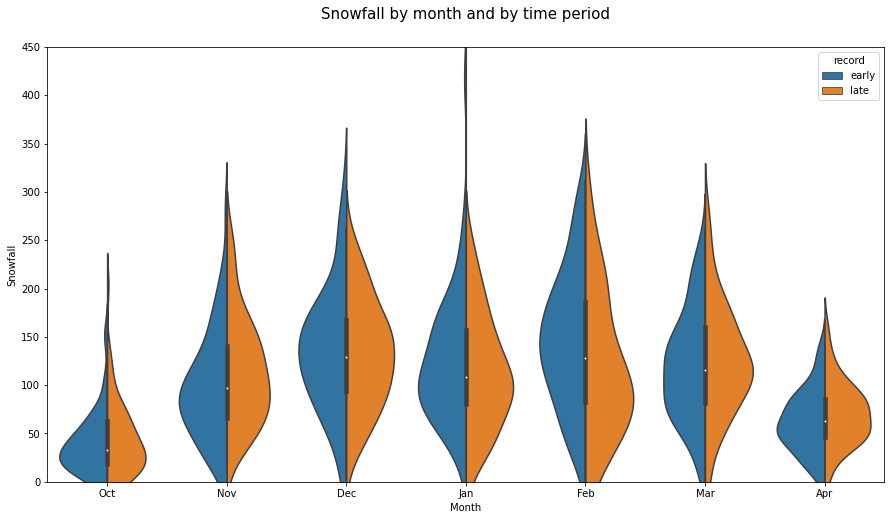

In [91]:
# Eplore what amounts of snowfall we're dealing with per month
# I suggest using .isin(winter_months_5)

# Adding a column to the monthly_data_winter dataframe to be able chronologically split data between 1901 and 2019 in half.
time_record = []
for year in monthly_data_winter['Year']:
    
    if year <= 1960:
        time_record.append('early')
    else:
        time_record.append('late')

time_record2 = np.array(time_record).T
monthly_data_winter = monthly_data_winter.assign(record = time_record2)


# Plotting the monthly snowfall in a violinplot with hue being the two periods in the record.
fig, ax = plt.subplots(figsize = (15,8))
snow_per_month = sns.violinplot(x='Month', 
                                y='Snowfall', 
                                data=monthly_data_winter,
                                order = ('Oct','Nov','Dec','Jan','Feb','Mar', 'Apr'),
                                hue = 'record',
                                split = True
                               
                               )

snow_per_month.set_ylim([0,450])
plt.title('Snowfall by month and by time period', y=1.05, fontsize=15)
# plt.grid(True)

plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_snow2_vio_M7')

> To better undestand the results of our data and which months to use for the *winter analysis*, it is useful to compare the snowfall over the months separately.
It turns out, that the violinplots are similarly shaped in the entire record, even in the early and late season. One of the more distinct shifts in Snowfall distribution happened in February where the concentration of the most usual Snowfall amounts declined from about 150mm to below 100mm across the two time periods

> Here the early and late records of the 20th (and early 21st) century don't vary much. Maybe we could spot more of a difference when splitting the data in 3 or more subsets?

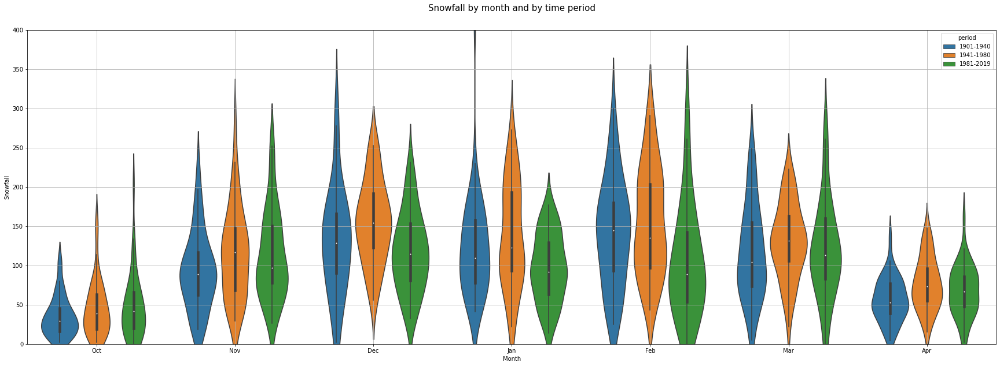

In [76]:
# Same plot, but differenciating between 3 distince periods in the record.
# I suggest using .isin(winter_months_7)

# Adding a column to the monthly_data_winter dataframe to be able chornologically split data between 1901 and 2019 in thirds.
time_record_3 = []
for year in monthly_data_winter['Year']:
    
    if year <= 1940:
        time_record_3.append('1901-1940'),
    elif year > 1940 and year <= 1980:
        time_record_3.append('1941-1980'),
    else:
        time_record_3.append('1981-2019')
         
time_record2 = np.array(time_record).T
monthly_data_winter = monthly_data_winter.assign(period = time_record_3)


# Plotting the monthly snowfall
fig, ax = plt.subplots(figsize = (30,10))
snow_per_month = sns.violinplot(x='Month', 
                                y='Snowfall', 
                                data=monthly_data_winter,
                                order = ('Oct','Nov','Dec','Jan','Feb','Mar', 'Apr'),
                                hue = 'period',
                               )

snow_per_month.set_ylim([0,400])
plt.title('Snowfall by month and by time period', y=1.05, fontsize=15)
plt.grid(True)

plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_snow3_vio_M7')

> Generally, the distributions show that the mid-century time period (1941-1980) is characterized by higher snowfall averages than the other periods. The latest time period's distributions (1981-2019) show mainly lower snowfall levels. Again, the month of February stands out with lower snowfall levels in the later periods.

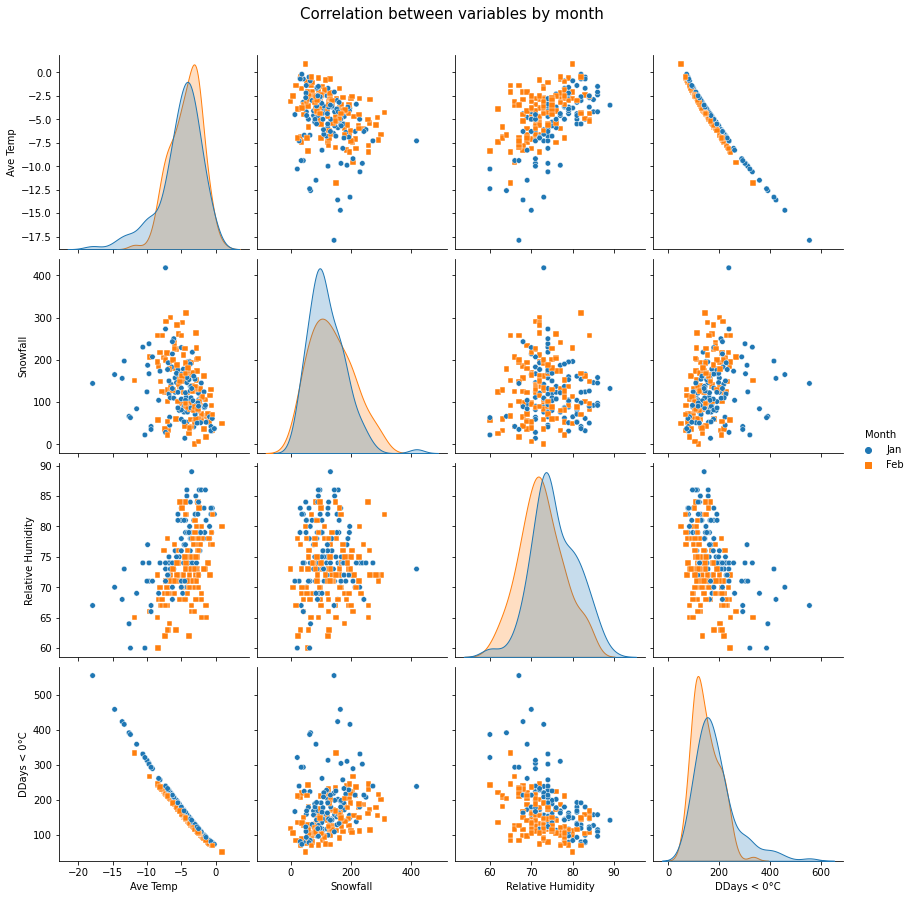

In [78]:
# Plotting correlations by month. Let's see if it changes from the seasonal data.
# This plot get's too messy if using more than two months to compare.
# Hence I stongly suggest using .isin(winter_months_2)

# Upper right corner different plot?
selected_df_winter_months = monthly_data_winter.loc[:,['Month','Ave Temp', 'Snowfall', 'Relative Humidity', 'DDays < 0°C']]
sns.pairplot(selected_df_winter_months, 
             kind = 'scatter', 
             diag_kind='kde', 
             height=3,
             markers=['o','s'], #,'D' for additional month
             plot_kws={'s':30},
             hue='Month'   # Using hue only really works for spectating a maximum of three months at a time. More months areoverwhelming.
) 
plt.suptitle('Correlation between variables by month', y=1.04, fontsize=15)

plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_cor_M')

> This is rather difficult to read. Best for analyzing 2 months at a time, almost impossible for more than 3 months

> The correlation matrix shows similar results as to when sorted by annual data. In some correlations, like DDays > 0°C and Relative Humidity, the February Data shows less spread and hence more signs of a correlation.

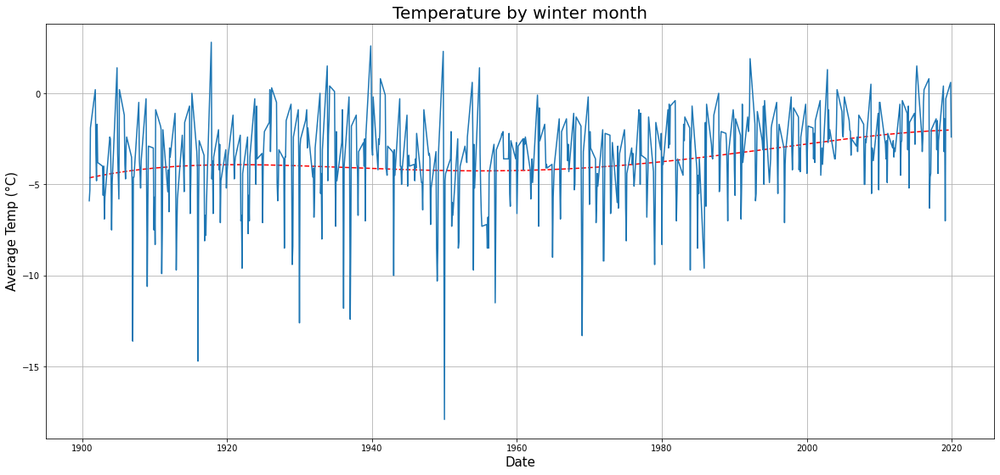

In [80]:
# plotting the Temperature trend with the monthly data.
# # I suggest using .isin(winter_months_5)

# turn string into date format, then date to Matplotlib date numbers for the trendline
monthly_data_winter = monthly_data_winter.assign(Year_month2 = pd.to_datetime(monthly_data_winter['Year_month']).dt.date)
num_dates = mdates.date2num(monthly_data_winter['Year_month2'])

# setting up the plot and the trendline
X = np.array(num_dates)
Y = np.array(monthly_data_winter['Ave Temp'])
fig, ax = plt.subplots(figsize = (20,9))
np.shape(X)
np.shape(Y)
Z = np.polyfit(X, Y, 4)
ZZ = np.poly1d(Z)
ax.plot(X, ZZ(X),'r--')
ax.plot(X, Y)

# labels, title and grid
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Average Temp (°C)', fontsize = 15)
plt.title('Temperature by winter month', fontsize = 20)
plt.grid(True)

# Show X-axis major tick marks as dates, impossible to read with all ticks showing
loc = mdates.AutoDateLocator()
plt.gca().xaxis.set_major_locator(loc)
plt.gca().xaxis.set_major_formatter(mdates.AutoDateFormatter(loc))
plt.gcf().autofmt_xdate

plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_temp_M')

> The internal variation with the monthly scale seems a bit overwhelming, but the trendline helps. The more recent trend shows significant warming again with the range of values diminishing as seen in previous graphs.

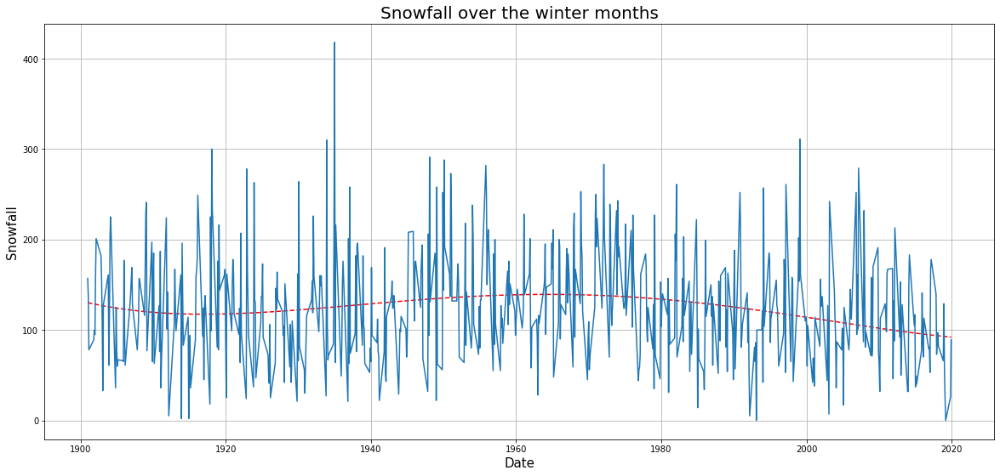

In [81]:
# Snowfall in single winter months
# I suggest using .isin(winter_months_5)

# setting up plot and trendline
X = np.array(num_dates)
Y = np.array(monthly_data_winter['Snowfall'])
fig, ax = plt.subplots(figsize = (20,9))
np.shape(X)
np.shape(Y)
Z = np.polyfit(X, Y, 4)
ZZ = np.poly1d(Z)
ax.plot(X, ZZ(X),'r--')
ax.plot(X, Y)

# labels, title and grid
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Snowfall', fontsize = 15)
plt.title('Snowfall over the winter months', fontsize = 20)
plt.grid(True)

# Show X-axis major tick marks as dates
loc = mdates.AutoDateLocator()
plt.gca().xaxis.set_major_locator(loc)
plt.gca().xaxis.set_major_formatter(mdates.AutoDateFormatter(loc))
plt.gcf().autofmt_xdate

plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_snow_M')

> It can be argued that there is an upwards trend in snowfall in the early 1900s and, more clearly, a downwards trend since the 1970s. This graph alligns surprisingly well with the plotted temperature trends.

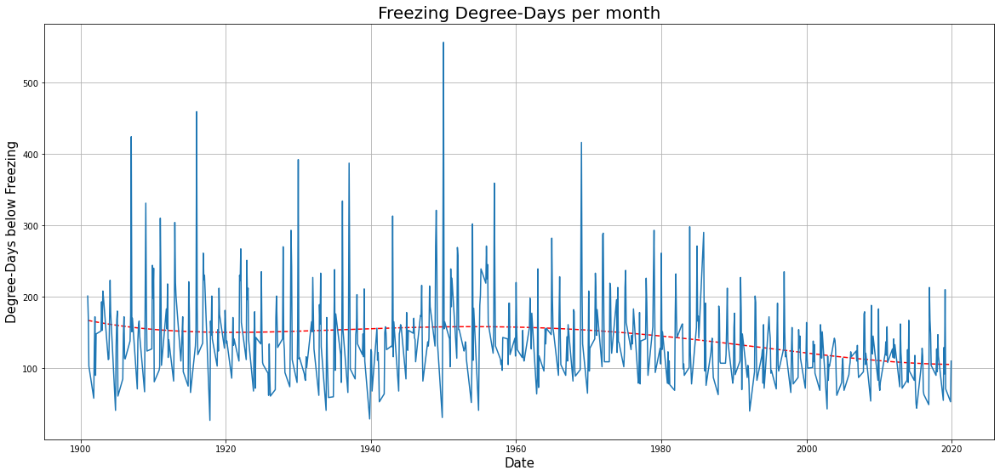

In [82]:
# I suggest using .isin(winter_months_5)

# Turn string into date format, then date to Matplotlib date numbers for the trendline
monthly_data_winter = monthly_data_winter.assign(Year_month2 = pd.to_datetime(monthly_data_winter['Year_month']).dt.date)
num_dates = mdates.date2num(monthly_data_winter['Year_month2'])

# Set up the plot and the trendlin
X = np.array(num_dates)
Y = np.array(monthly_data_winter['DDays < 0°C'])
fig, ax = plt.subplots(figsize = (20,9))
np.shape(X)
np.shape(Y)
Z = np.polyfit(X, Y, 4)
ZZ = np.poly1d(Z)
ax.plot(X, ZZ(X),'r--')
ax.plot(X, Y)

# labels, title and grid
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Degree-Days below Freezing', fontsize = 15)
plt.title('Freezing Degree-Days per month', fontsize = 20)
plt.grid(True)

# Show X-axis major tick marks as dates
loc = mdates.AutoDateLocator()
plt.gca().xaxis.set_major_locator(loc)
plt.gca().xaxis.set_major_formatter(mdates.AutoDateFormatter(loc))
plt.gcf().autofmt_xdate

plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_DD0_M')

> The amplitude of the data certainly decreases since the 1960s. As we saw previously, the Degree-days below freezing variable is highly correlated to the average temperature so this is no surprise.
Similarly to the snowfall data, there seems to be a downwards trend in recent years since the 1970s. 

# Conclusions, answering research questions

#### As mentioned, the comments and conclusion in this notebook only cover the data from Whister Blackcomb in British Columbia

- Several graphs show the expected characteristic trends of climate change, especially since around the 1970s. There is a general increase in average temperature while snowfall and degree-days below freezing decline over the end of the record. The average temperature even rose by a few degrees Celsius in the investigated time period. From a climatic standpoint, that is a very big margin. 

- The *diurnal range*, the range between hottest and coldest temperature is shrinking which is a phenomenon commonly observed as a consequence of our warming climate

- Snowfall is experiencing a substantial decline in the last decades, dipping from close to 200mm to a below-100mm level.

- When dividing the entire record period (1901-2019) into two halves, there is no great change in monthly snowfall to be observed, apart from lower snowfall levels observed in February.

- When dividing the record into thirds, the monthly lower snowfall distributions in the more recent times become more obvious. Again, this change is strongest in February.

- When comparing these results to climate change research, it is noticeable that the trends acutally are very consistent with climatic responses on a bigger scale. Rising temperatures, declining snowfall and shorter winters (especially because of an early spring) are very characteristic signs of our warming climate.

- Even the trends from ealier record fit the general climatic trends on earth: Global temperatures were stagnating between 1940 and 1970 before they resumed their steep rise in the 1970s. I will emphasize and elaborate this in my literlature review and finishing paper

- Important note: Analysis from 1 or even 10 ski resorts aren't very conclusive. With this data, it is possible to determine if the data agrees with general climatic developments. The observations from our climate data could have many causes however. One big problem of climatology is that the individual event or trend can (almost) never be entirely contributed to a specific cause. Climate responses and dynamics are very complicated, hence I will not draw any bigger conclusions from my data (yet). After analyzing all the ski resorts that I'm hoping to get to, I should be able to answer the questions if there is a general difference between continental and pacific ski resort locations in terms of changing climatic conditions as well as if all trends in the ski resorts agree or if they perhaps oppose one another.

- Methods: In climatic analysis, line plots are everything. Sometimes, it is less important to determine potential correlations between some variables since there are an incredible amount of variables involved and huge datasets are required for a meaningful analysis. Additionally, the relationship between Degree-Days below freezing and average temperatures for example is very obvious and always highly correlated. With the lineplots however, individual and interesting trends in climatic records can be found and shown.

- Further comments: When plotting the climate data, using more months gives a more solid picture but it turns chaotic very quick. Sometimes, using 2-3 months instead of 7 shows the same trends but the graphs are a lot more viewer friendly. That is why I wrote the code to be very flexible with different definitions of *winter months*. It could be good to smooth out the data before plotting it for some of the monthly data plots.